# Cellrank with time series dataset (WOT) on Endothelial compartment

In [1]:
import sys
import matplotlib.pyplot as plt
import scvelo as scv
import scanpy as sc
import cellrank as cr
from matplotlib import cm
from cellrank.kernels import RealTimeKernel
from cellrank.kernels import ConnectivityKernel

# set verbosity levels
cr.settings.verbosity = 2
scv.settings.verbosity = 3

# figure settings
scv.settings.set_figure_params(
    "scvelo", dpi_save=400, dpi=80, transparent=True, fontsize=12, color_map="viridis"
)

/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Load adata object
adata = sc.read_h5ad("/oak/stanford/groups/wjg/skim/projects/LDA/3_trajectories/adata/lda.h5ad")

In [3]:
# Subset to endothelial cells only
celltypes = ["egCap", "lgCap","lAero","eAero", "eArtr", "lArtr", "Veno"]
adata = adata[adata.obs['FineNamedClust'].isin(celltypes)]

In [4]:
# Create a color map for endothelial cells
endo_colors = {"egCap":"#FBB220", "lgCap":"#D8A767", "lAero":"#F8D38A",
        "eAero":"#EBC549", "eArtr":"#906652", "lArtr":"#F09FAB", "Veno":"#FEE52C"}

/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


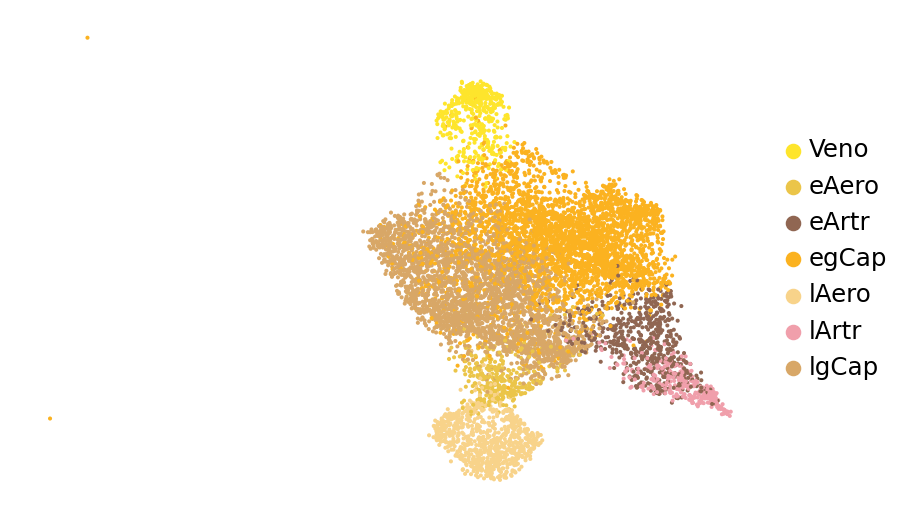

In [5]:
sc.pl.umap(adata, color=['FineNamedClust'],palette=endo_colors, frameon=False, title=['', ''])

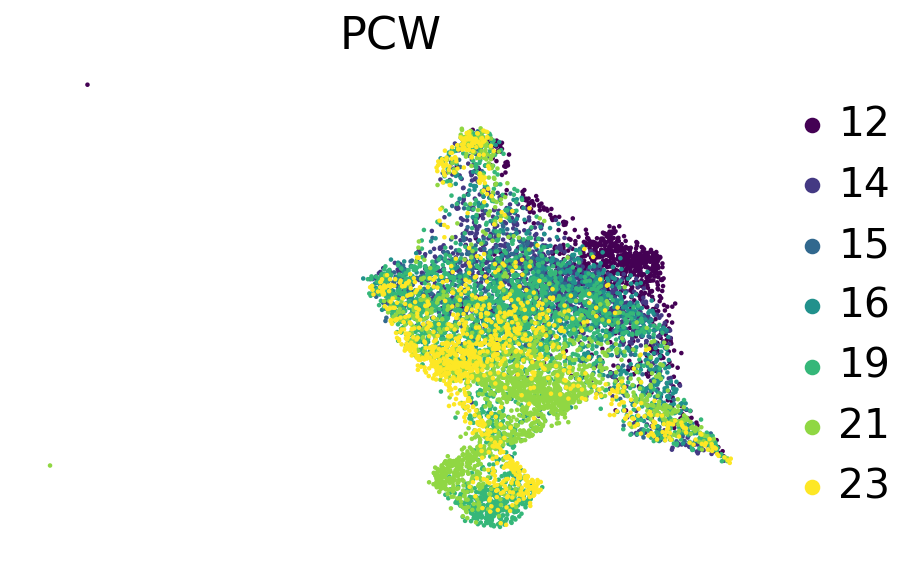

In [6]:
# Using scv plotting to check object
scv.settings.set_figure_params(
    "scvelo", dpi_save=400, dpi=80, transparent=True, fontsize=20, color_map='viridis'
)

scv.pl.scatter(adata, color="PCW", legend_loc="right", palette="viridis")

In [7]:
# Calculate nearest neighbors
sc.pp.neighbors(adata, random_state=0)

In [8]:
# Add highly variable genes. Adding batch_key only selects variable genes consistent after ranking from each batch
sc.pp.highly_variable_genes(adata, batch_key="Sample")

In [9]:
# Initialize the WOT kernel
import wot
ot_model=wot.ot.OTModel(adata, day_field="PCW")
ot_model.compute_all_transport_maps(tmap_out="tmaps/")

rtk = cr.kernels.RealTimeKernel.from_wot(adata, path = "tmaps/", time_key="PCW")
rtk = rtk.compute_transition_matrix()

100%|██████████| 6/6 [00:00<00:00, 17537.16time pair/s]

Using automatic `threshold=0.009153197245864088`


Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)


Simulating `30` random walks of maximum length `500`


100%|██████████| 30/30 [00:02<00:00, 10.25sim/s]


    Finish (0:00:02)
Plotting random walks


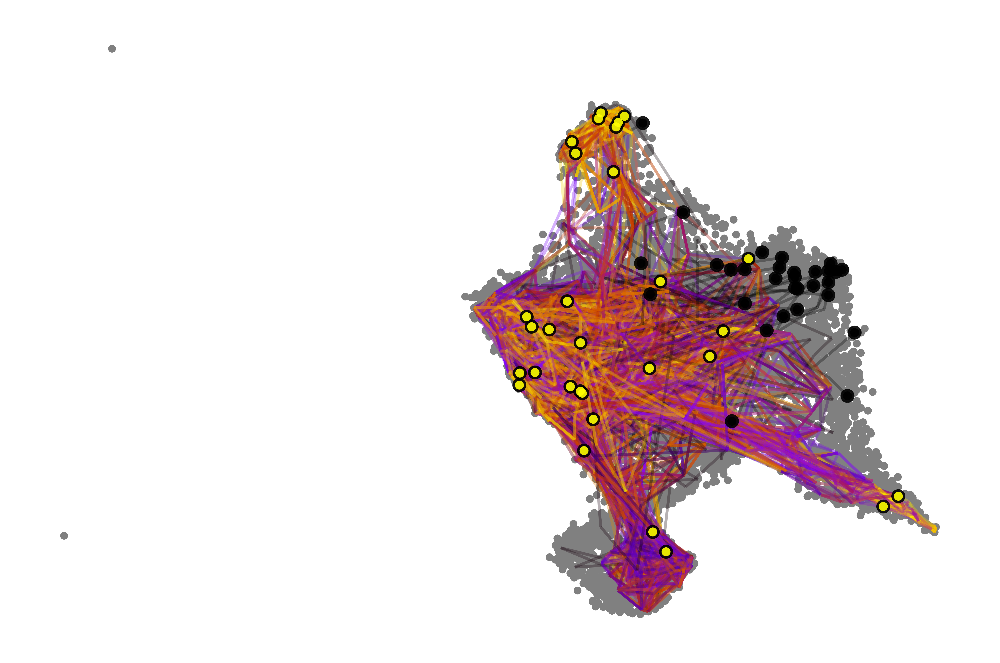

In [10]:
# Visualize recovered dynamics by random walks
rtk.plot_random_walks(
    n_sims=30,
    max_iter=500,
    start_ixs={"PCW": 12},
    basis="umap",
    seed=0,
    size=30,
    dpi=600,
    save="wot_randomwalk_30sims_500iter_fromPCW12.svg"
)

Computing flow from `egCap` into `3` cluster(s) in `6` time points
Plotting flow from `egCap` into `2` cluster(s) in `6` time points


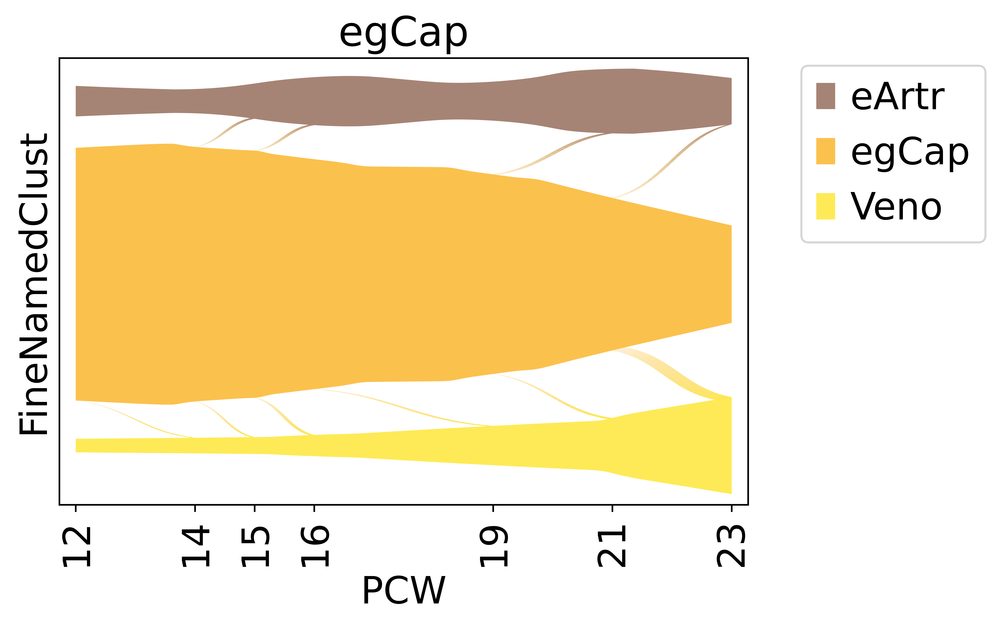

In [11]:
#Probability mass flow in time
ax = rtk.plot_single_flow(
    cluster_key="FineNamedClust",
    time_key="PCW",
    cluster="egCap",
    min_flow=0.01,
    xticks_step_size=1,
    show=False,
    dpi=600,
    clusters=["eArtr", "lArtr", "Veno"],
)

# prettify the plot a bit, rotate x-axis tick labels
locs, labels = plt.xticks()
ax.set_xticks(locs)
ax.set_xticklabels(labels, rotation=90)

plt.show()

In [12]:
#Compute macrostates

# First add a connectivity matrix (helps with the numerical calculations)
ck = ConnectivityKernel(adata)
ck.compute_transition_matrix()

combined_kernel = 0.8 * rtk + 0.2 * ck

Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)


Computing Schur decomposition
When computing macrostates, choose a number of states NOT in `[18, 20]`
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:11)


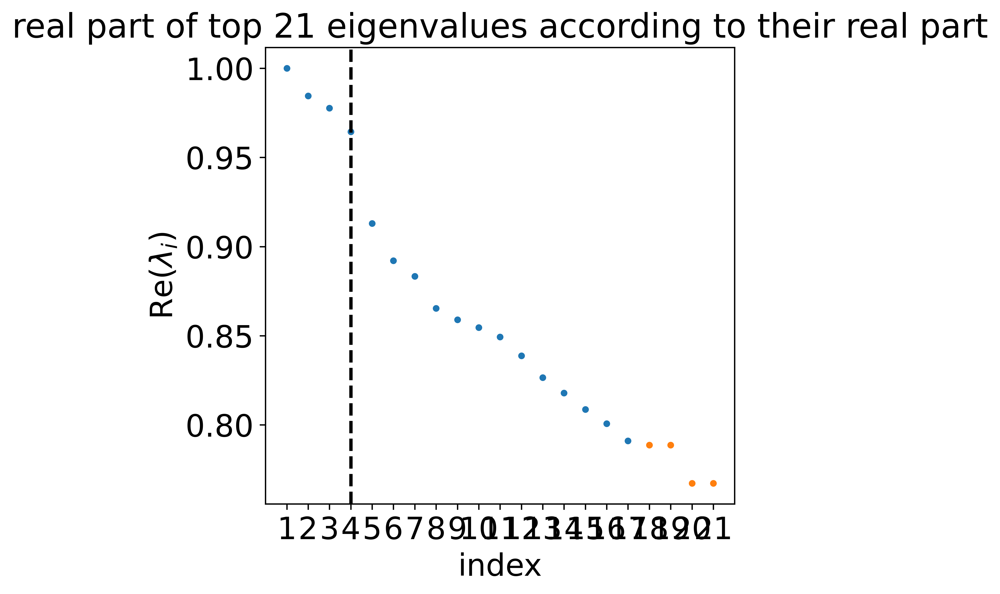

In [13]:
# Initialize GPCCA estimator
g = cr.estimators.GPCCA(combined_kernel)

# Compute and plot Schur decomposition
g.compute_schur()
g.plot_spectrum(real_only=True, dpi= 300, save = "wot_eigengap.pdf")

Computing `4` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)


/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/scvelo/plotting/scatter.py:655: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


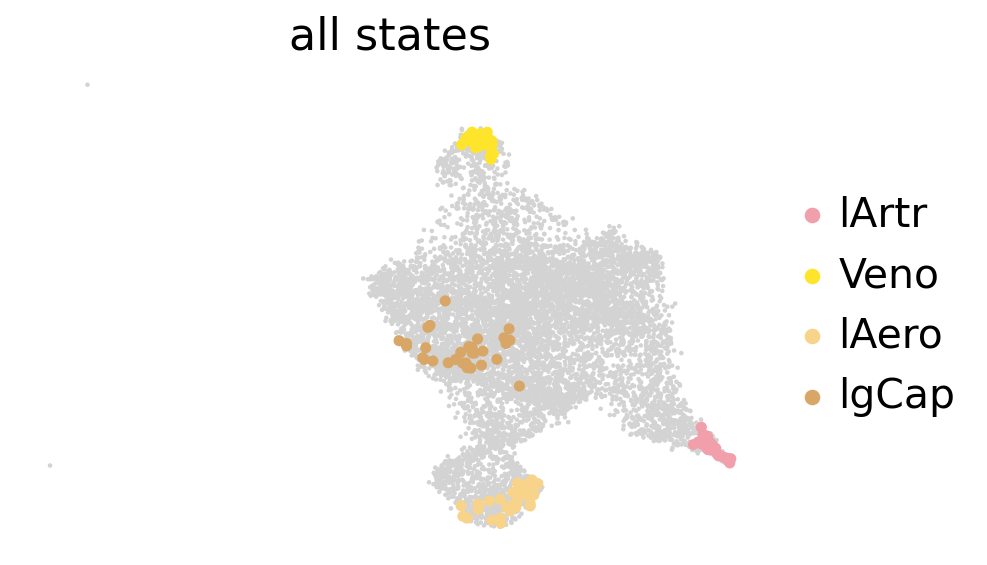

In [14]:
g.compute_macrostates(n_states=4, cluster_key="FineNamedClust")
g.plot_macrostates(which="all", discrete=True, legend_loc="right", s=100)

Adding `adata.obs['term_states_fwd']`
       `adata.obs['term_states_fwd_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/scvelo/plotting/scatter.py:655: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


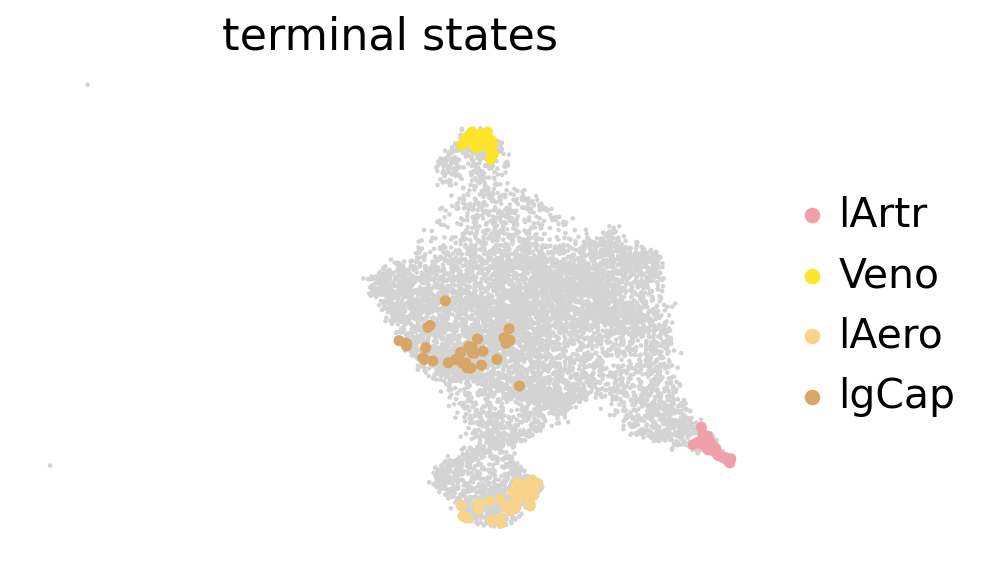

In [15]:
g.predict_terminal_states()
g.plot_macrostates(which="terminal", legend_loc="right", s=100)

/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/scvelo/plotting/scatter.py:655: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/scvelo/plotting/scatter.py:655: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


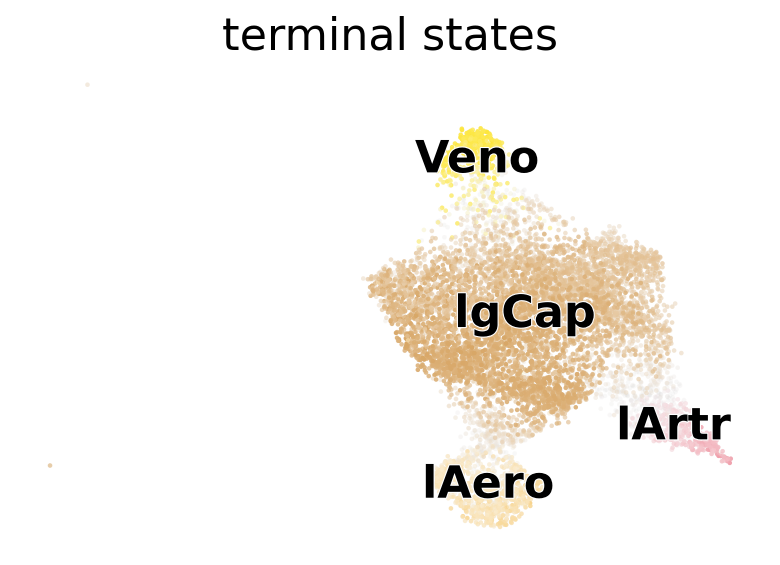

In [16]:
g.plot_macrostates(which="terminal", discrete=False)

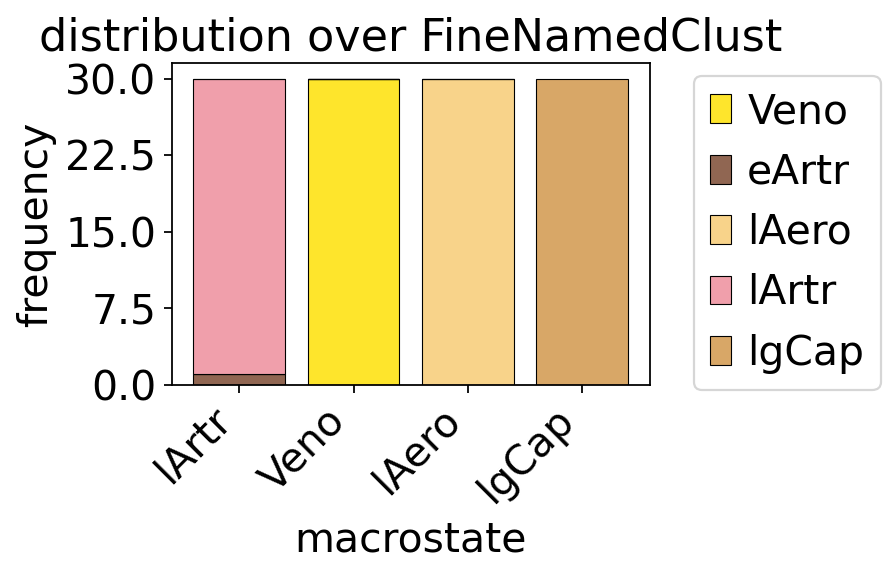

In [17]:
g.plot_macrostate_composition(key="FineNamedClust")

In [18]:
# Defining terminal states
g.set_terminal_states(["lArtr", "Veno", "lAero", "lgCap"])

Adding `adata.obs['term_states_fwd']`
       `adata.obs['term_states_fwd_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


GPCCA[kernel=(0.8 * RealTimeKernel[n=8897] + 0.2 * ConnectivityKernel[n=8897]), initial_states=None, terminal_states=['Veno', 'lAero', 'lArtr', 'lgCap']]

In [19]:
# Define initial states
g.set_initial_states({"FineNamedClust":"egCap"})

Adding `adata.obs['init_states_fwd']`
       `adata.obs['init_states_fwd_probs']`
       `.initial_states`
       `.initial_states_probabilities`
       `.initial_states_memberships
    Finish`


GPCCA[kernel=(0.8 * RealTimeKernel[n=8897] + 0.2 * ConnectivityKernel[n=8897]), initial_states=['egCap'], terminal_states=['Veno', 'lAero', 'lArtr', 'lgCap']]

In [20]:
# Compute absorption probabilities, probability that an earlier ancestor cell became this descendant cell
g.compute_fate_probabilities(solver="gmres")

Computing fate probabilities


100%|██████████| 4/4 [00:00<00:00,  7.52/s]

Adding `adata.obsm['lineages_fwd']`
       `.fate_probabilities`
    Finish (0:00:00)


saving figure to file ./figures/scvelo_FateProb_UMAP_Macrostates.pdf


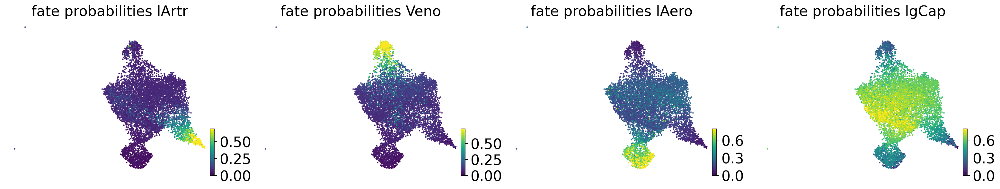

In [21]:
g.plot_fate_probabilities(
    same_plot=False, 
    basis="umap", 
    perc=[0, 99], 
    save="FateProb_UMAP_Macrostates.pdf")

Solving TSP for `4` states


/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.

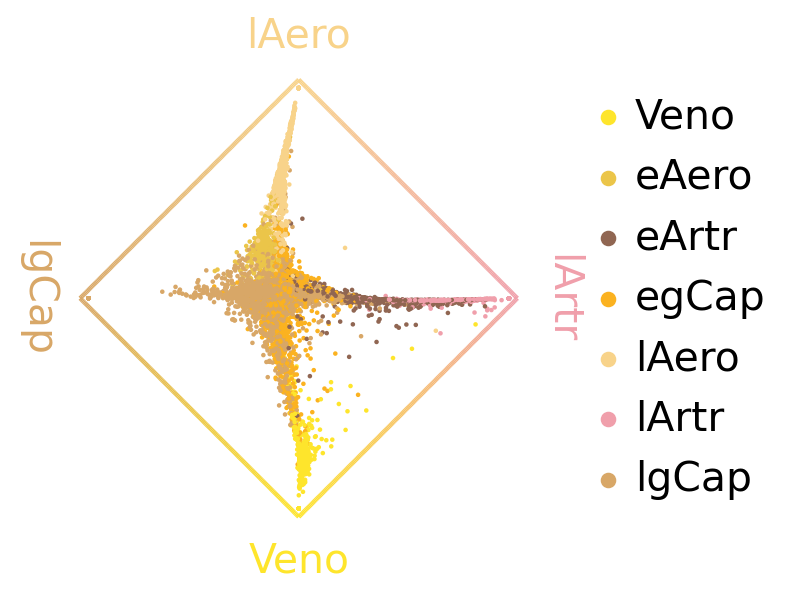

In [22]:
cr.pl.circular_projection(
    adata, 
    keys=["FineNamedClust"], 
    legend_loc="right", 
    title="",
    save="FateProb_CircularProjection_Macrostates.pdf",
    fontsize=12
)

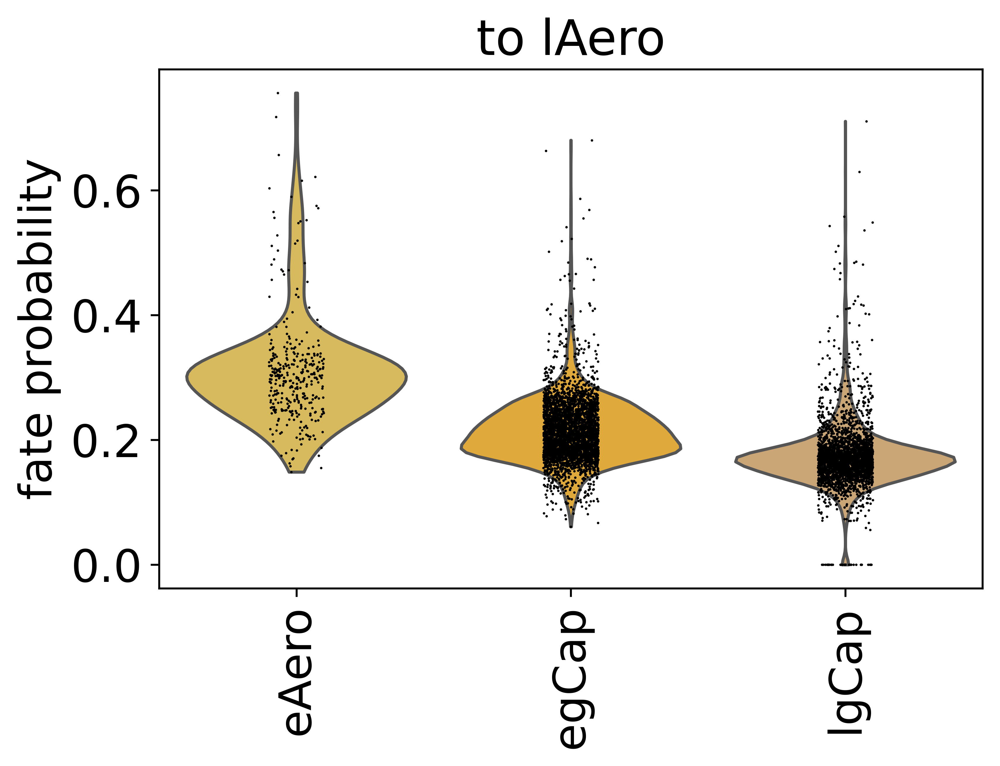

In [23]:
cr.pl.aggregate_fate_probabilities(
    adata, 
    mode="violin", 
    lineages=["lAero"],
    cluster_key="FineNamedClust", 
    clusters=["egCap", "eAero", "lgCap"],
    dpi=300,
    save="AggregatedFateProb_Violin_lAero.pdf"
)

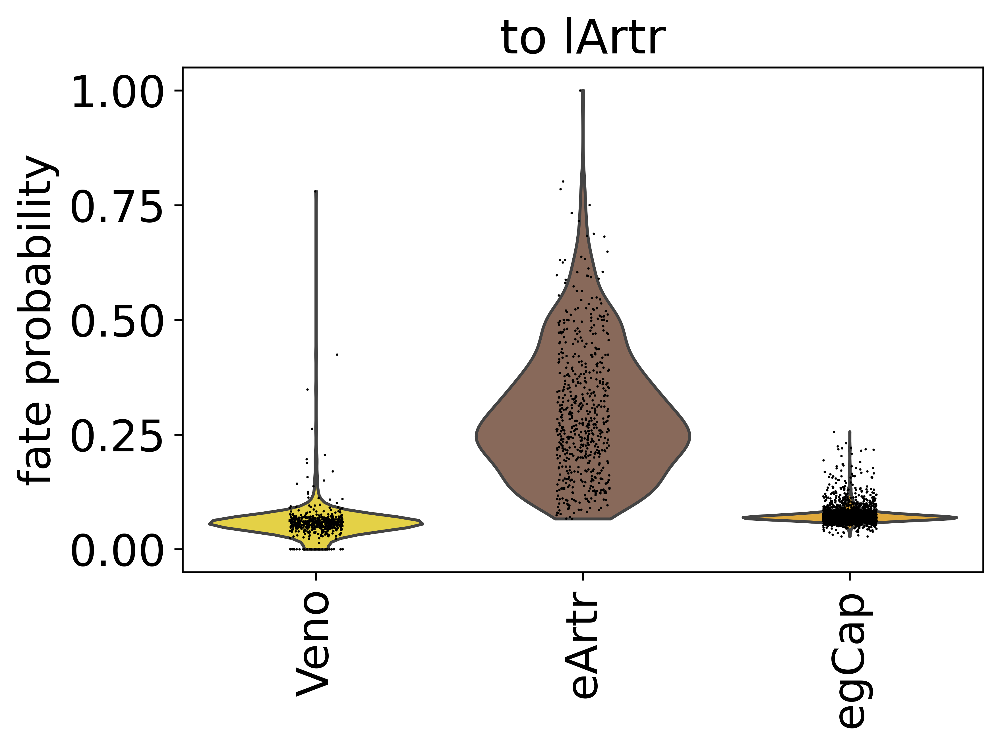

In [24]:
cr.pl.aggregate_fate_probabilities(
    adata, 
    mode="violin", 
    lineages=["lArtr"],
    cluster_key="FineNamedClust", 
    clusters=["egCap", "eArtr", "Veno"],
    dpi=300,
    save="AggregatedFateProb_Violin_lArtr.pdf"
)

In [25]:
import pandas
aero_df = g.compute_lineage_drivers(
    lineages=["lAero"], cluster_key="FineNamedClust", clusters=["egCap", "eAero", "lgCap", "lAero"]
)
aero_df.head(30)
aero_df.to_csv("driver_genes/lAero_driver_genes.csv")

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:00)


In [26]:
artr_df = g.compute_lineage_drivers(
    lineages=["lArtr"], cluster_key="FineNamedClust", clusters=["egCap", "lgCap", "eArtr", "lArtr"]
)
artr_df.head(30)
artr_df.to_csv("driver_genes/lArtr_driver_genes.csv")

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:00)


In [27]:
veno_df = g.compute_lineage_drivers(
    lineages=["Veno"], cluster_key="FineNamedClust", clusters=["egCap", "lgCap", "Veno"]
)
veno_df.head(30)
veno_df.to_csv("driver_genes/Veno_driver_genes.csv")

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:00)


In [28]:
gCap_df = g.compute_lineage_drivers(
    lineages=["lgCap"], cluster_key="FineNamedClust", clusters=["egCap", "lgCap"]
)
gCap_df.head(30)
gCap_df.to_csv("driver_genes/gCap_driver_genes.csv")

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:00)


In [29]:
# Driver genes across all terminal states
driver_df = g.compute_lineage_drivers()
driver_df.to_csv("driver_genes/all_driver_genes.csv")

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:01)


In [51]:
model = cr.models.GAMR(p_adata, n_knots=6, smoothing_penalty = 10)

Computing trends using `1` core(s)


100%|██████████| 20/20 [00:02<00:00,  8.20gene/s]


    Finish (0:00:02)


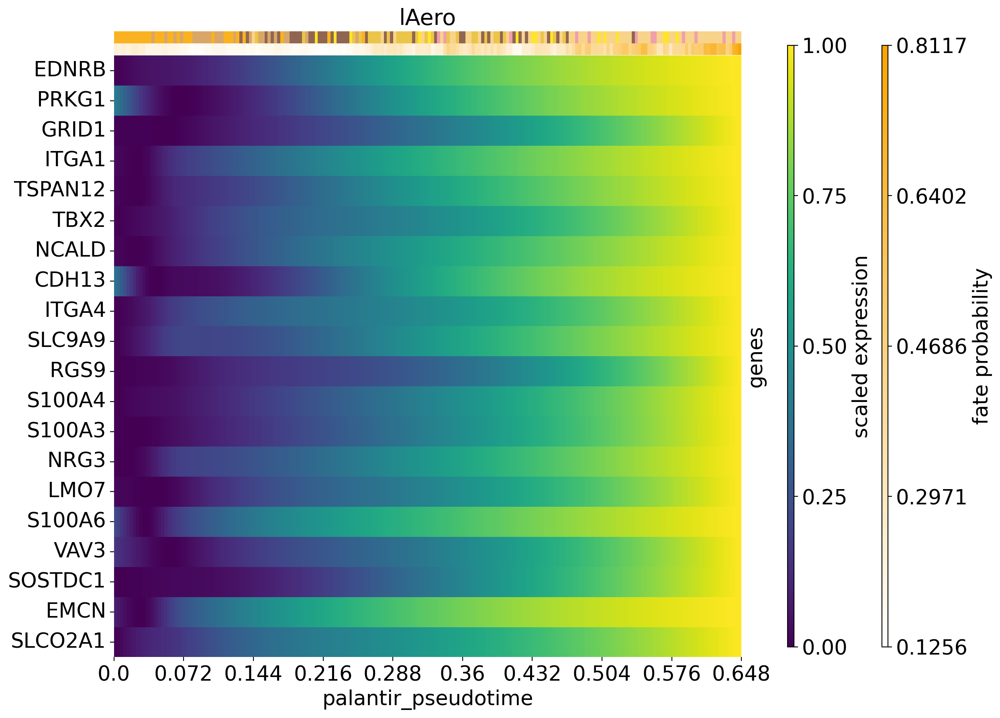

In [53]:
# plot heatmap
cr.pl.heatmap(
    p_adata,
    model=model,  # use the model from before
    lineages="lAero",
    cluster_key="FineNamedClust",
    show_fate_probabilities=True,
    genes=aero_df.head(20).index,
    time_key="palantir_pseudotime",
    figsize=(12, 10),
    show_all_genes=True,
    weight_threshold=(1e-3, 1e-3),
)

ERROR: Please install `adjustText` first as `pip install adjustText`


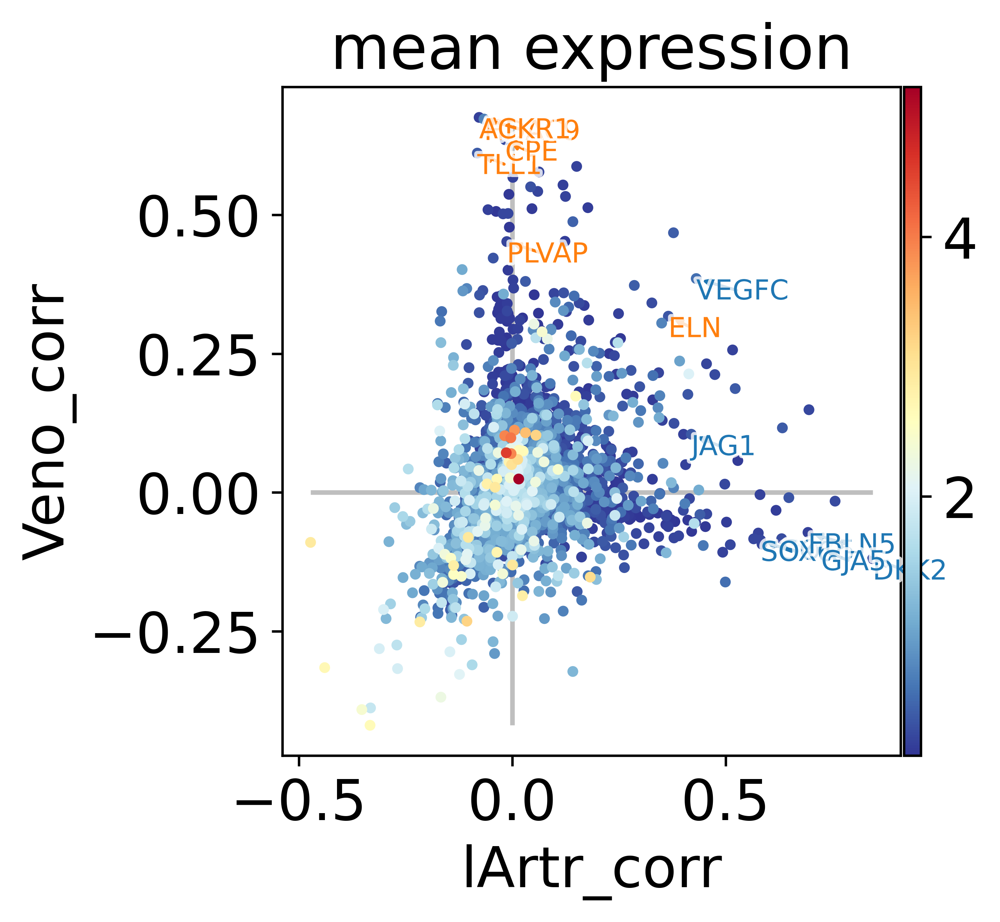

In [30]:
artr_genes=["DKK2", "GJA5", "FBLN5", "SOX5", "SOX6", "VEGFC", "JAG1"]
veno_genes=["CPE", "HDAC9", "ACKR1", "ELN", "PLVAP", "TLL1"]

genes_oi = {
    "Arterial": artr_genes,
    "Venous": veno_genes,
}

# make sure all of these exist in AnnData
assert [
    gene in adata.var_names for genes in genes_oi.values() for gene in genes
], "Did not find all genes"

# compute mean gene expression across all cells
adata.var["mean expression"] = adata.X.A.mean(axis=0)

# visualize in a scatter plot
g.plot_lineage_drivers_correlation(
    lineage_x="lArtr",
    lineage_y="Veno",
    adjust_text=True,
    gene_sets=genes_oi,
    color="mean expression",
    legend_loc="none",
    dpi=300,
    fontsize=9,
    size=50,
    save="lArtr_Veno_meanexpression_scatter.pdf"
)

In [31]:
sc.tl.paga(adata, groups="FineNamedClust")

/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.

/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/networkx/convert.py:158: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  return nx.from_scipy_sparse_matrix(data, creat

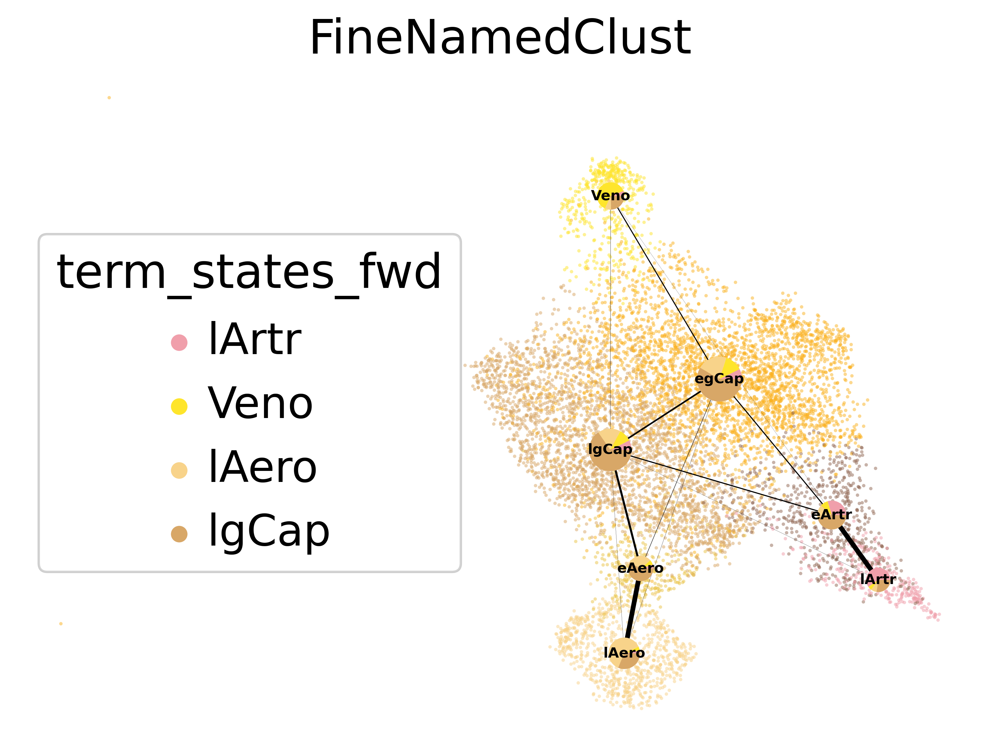

In [32]:
cr.pl.aggregate_fate_probabilities(
    adata,
    mode="paga_pie",
    cluster_key="FineNamedClust",
    basis="umap",dpi=300, figsize=[7,5], fontsize = 6
)

In [33]:
import palantir

/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/mellon/__init__.py:1: DeprecationWarning: Accessing jax.config via the jax.config submodule is deprecated.
  from jax.config import config as jaxconfig
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/mellon/util.py:9: DeprecationWarning: Accessing jax.config via the jax.config submodule is deprecated.
  from jax.config import config as jaxconfig


In [34]:
p_adata=adata

In [35]:
palantir.preprocess.log_transform(p_adata)

In [36]:
# Run diffusion maps
dm_res = palantir.utils.run_diffusion_maps(p_adata, n_components=5)
ms_data = palantir.utils.determine_multiscale_space(p_adata)

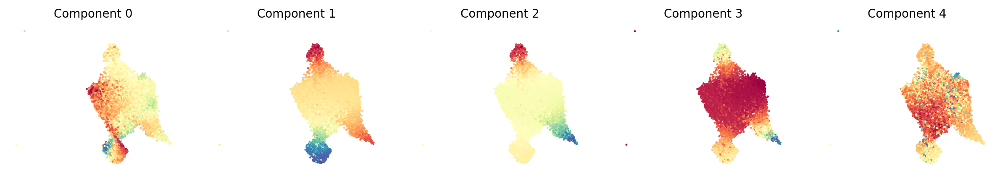

In [37]:
palantir.plot.plot_diffusion_components(p_adata)
plt.show()

In [147]:
# Print cells that could be an early cell
p_adata.obs[(p_adata.obs["FineNamedClust"] == "Veno")]

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,nCount_SCT,nFeature_SCT,SCT_snn_res.0.5,seurat_clusters,Sample,preservation,...,SCT_snn_res.0.9,BroadClust,BroadNamedClust,sub.cluster,FineClust,FineNamedClust,compartment,PCW,macrostates_fwd,clusters_gradients
PCW12_AAAGGCTCAGCTAATT-1,PCW12,5699.0,2783,5.071065,5699.0,2783,2,26,PCW12,fresh,...,28,26,Veno,26,26,Veno,Endothelial,12,NaN,Veno
PCW12_AATCTTGAGGTAGCTT-1,PCW12,12441.0,4652,3.174986,12441.0,4652,2,26,PCW12,fresh,...,28,26,Veno,26,26,Veno,Endothelial,12,NaN,Veno
PCW12_ACGCCACAGTTGGGCC-1,PCW12,5958.0,2700,6.143001,5958.0,2700,2,26,PCW12,fresh,...,0,26,Veno,26,26,Veno,Endothelial,12,NaN,lgCap
PCW12_AGCTGCTCAATTAAGG-1,PCW12,57850.0,8722,4.504754,57850.0,8722,2,26,PCW12,fresh,...,28,26,Veno,26,26,Veno,Endothelial,12,NaN,Veno
PCW12_AGTAGCTTCAAGGACA-1,PCW12,5036.0,2463,4.686259,5036.0,2463,2,26,PCW12,fresh,...,28,26,Veno,26,26,Veno,Endothelial,12,NaN,Veno
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PCW23_TTGCCCGTCATCCTAT-1,PCW23,22087.0,5579,3.653733,22087.0,5579,14,26,PCW23,frozen,...,28,26,Veno,26,26,Veno,Endothelial,23,Veno,Veno
PCW23_TTGTCCCAGTTTGCGG-1,PCW23,3361.0,1752,4.522464,3361.0,1752,14,26,PCW23,frozen,...,28,26,Veno,26,26,Veno,Endothelial,23,NaN,Veno
PCW23_TTTAAGGTCAATAGCC-1,PCW23,4729.0,2090,3.319941,4729.0,2090,14,26,PCW23,frozen,...,28,26,Veno,26,26,Veno,Endothelial,23,NaN,Veno
PCW23_TTTCTCACAAGGTATA-1,PCW23,5519.0,2356,3.823156,5519.0,2356,14,26,PCW23,frozen,...,28,26,Veno,26,26,Veno,Endothelial,23,NaN,Veno


(<Figure size 400x400 with 1 Axes>, <Axes: >)

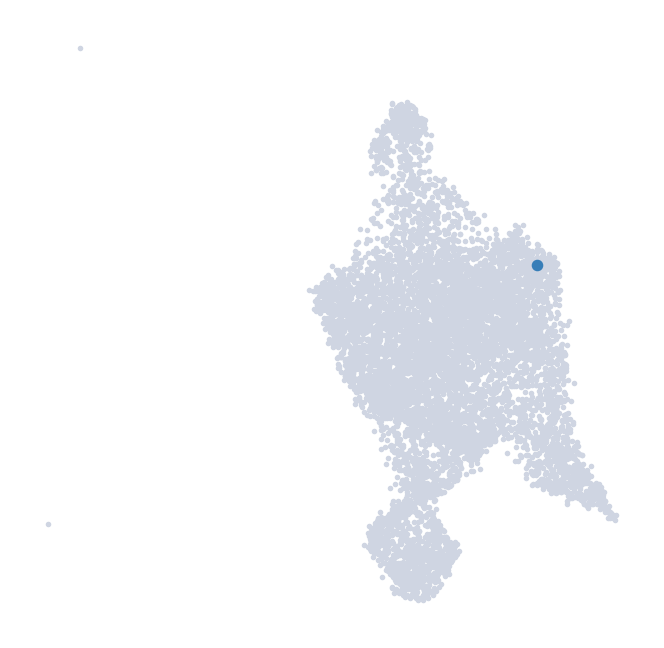

In [39]:
palantir.plot.highlight_cells_on_umap(p_adata, ["PCW12_AAACCGGCAATCCCTT-1"])

In [40]:
import pandas as pd
terminal_states = pd.Series(["lAero", "lgCap", "lArtr", "Veno"],
                           index=["PCW23_TTGGGTTAGCGCATTG-1","PCW23_TTTGTGTTCCGGTATG-1","PCW23_TTTCTTGCATCATGGC-1","PCW23_TTGTCCCAGTTTGCGG-1"])
start_cell = "PCW12_AAACCGGCAATCCCTT-1"

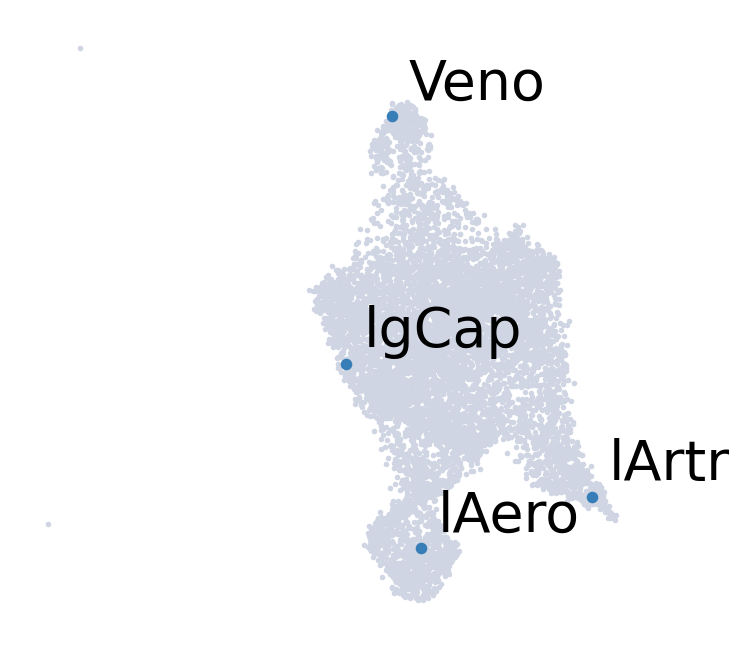

In [41]:
palantir.plot.highlight_cells_on_umap(p_adata, terminal_states)
plt.show()

In [42]:
pr_res = palantir.core.run_palantir(
    p_adata, start_cell, num_waypoints=500, terminal_states=terminal_states
)

/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/pandas/core/algorithms.py:1743: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  return lib.map_infer(values, mapper, convert=convert)
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/sklearn/utils/validation.py:595: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/sklearn/utils/validation.py:604: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


Sampling and flocking waypoints...
Time for determining waypoints: 0.01007153590520223 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...


/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/pandas/core/algorithms.py:1743: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  return lib.map_infer(values, mapper, convert=convert)
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/sklearn/utils/validation.py:595: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/sklearn/utils/validation.py:604: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/traject

Time for shortest paths: 0.19882255395253498 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Computing fundamental matrix and absorption probabilities...


/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/pandas/core/algorithms.py:1743: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  return lib.map_infer(values, mapper, convert=convert)
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/sklearn/utils/validation.py:595: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/trajectory/lib/python3.9/site-packages/sklearn/utils/validation.py:604: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/oak/stanford/groups/wjg/skim/software/miniconda3/envs/traject

Project results to all cells...


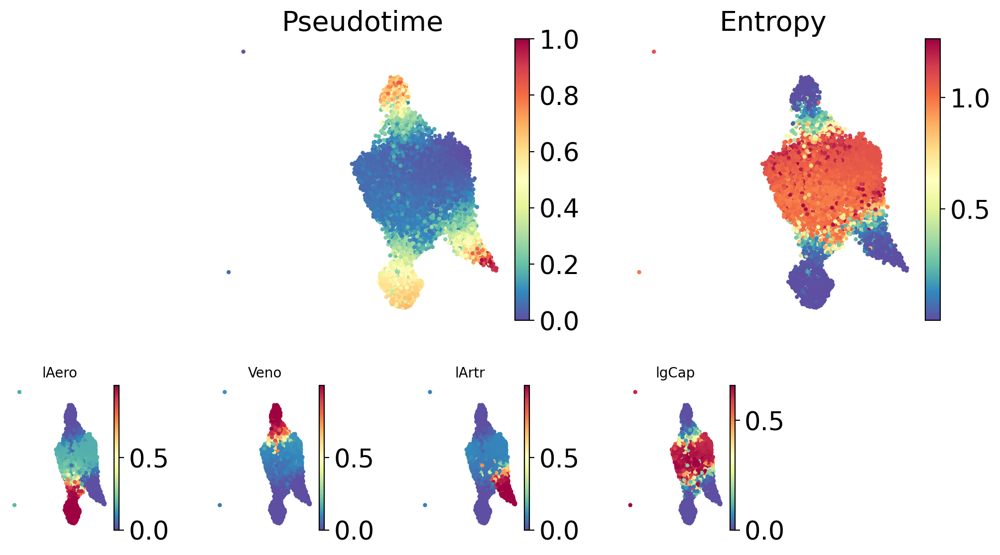

In [43]:
palantir.plot.plot_palantir_results(p_adata, s=4)
plt.show()

In [44]:
masks = palantir.presults.select_branch_cells(p_adata, eps = 0)

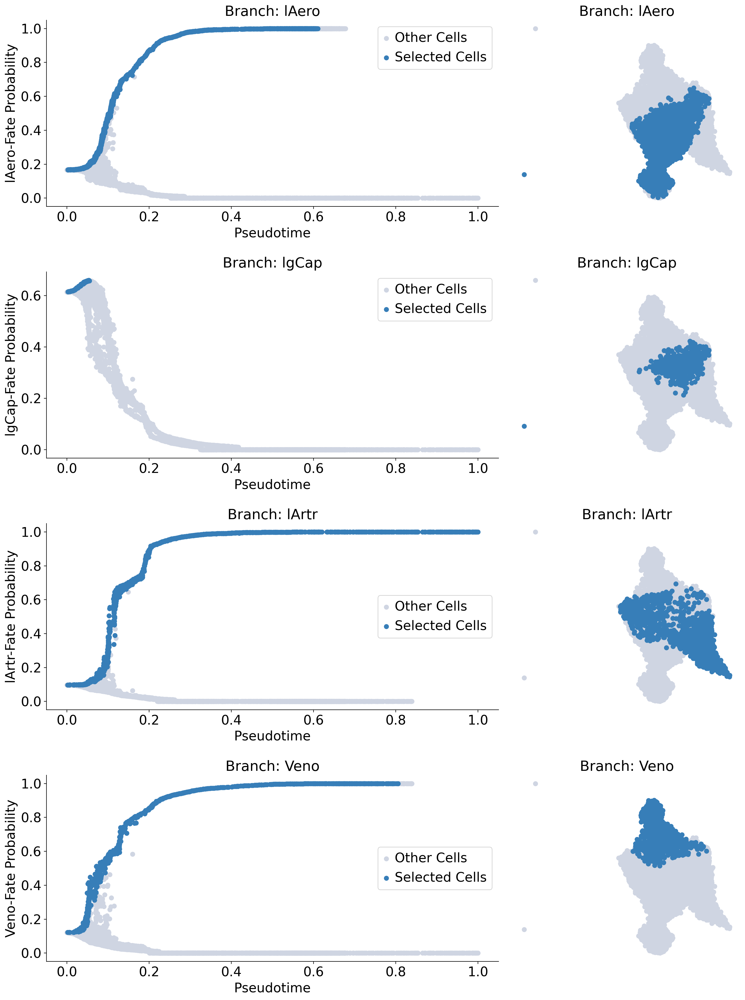

In [45]:
palantir.plot.plot_branch_selection(p_adata)
plt.show()

In [46]:
p_adata

AnnData object with n_obs × n_vars = 8897 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.5', 'seurat_clusters', 'Sample', 'preservation', 'sex', 'age', 'SCT_snn_res.0.8', 'Clusters', 'S.Score', 'G2M.Score', 'Phase', 'SCT_snn_res.0.6', 'SCT_snn_res.1', 'SCT_snn_res.0.9', 'BroadClust', 'BroadNamedClust', 'sub.cluster', 'FineClust', 'FineNamedClust', 'compartment', 'PCW', 'macrostates_fwd', 'term_states_fwd', 'term_states_fwd_probs', 'clusters_gradients', 'init_states_fwd', 'palantir_pseudotime', 'palantir_entropy'
    var: 'name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean expression'
    uns: 'FineNamedClust_colors', 'PCW_colors', 'neighbors', 'hvg', 'schur_matrix_fwd', 'eigendecomposition_fwd', 'macrostates_fwd_colors', 'coarse_fwd', 'term_states_fwd_colors', 'clusters_gradients_colors', 'init_states_fwd_colors', 'paga', 'FineNam

In [48]:
p_adata.write("01_WOT_Endothelial_Palantir.h5ad")

In [49]:
adata.write("01_WOT_Endothelial.h5ad")